# 1) WCD BIG DATA PROJECT - TWITTER - INFLATION - SENTIMENT CLASSIFICATION

**WeCloudData Bootcamp 2022 (Part-time Cohort)**<br> </font>
By: Kevin Jeswani & Junaid Zafar <br>
The set of notebooks are segmented for the purpose of clarity & convenience <br>
The following is the suggested order for running the scripts:
- '1_WCD_Twitter_Inflation_Classification'  **This Notebook**  - Mounted S3 bucket for inflation tweets, copied over twitter data, tweet cleaning. VADER & Spark-NLP pre-trained model is used to apply labels to the inflation tweets. The data is then transformed with spark-ml. Logistic regression & random forest are built and trained with gridsearchCV on the label and transformed token features.
- '2_WCD_Twitter_AllTopics_Clustering' - All topics in the WCD twitter bucket are filtered, custom transformers are built and inserted into an extensive pipeline to load raw data from Kinesis firehose. Clustering uses Latent Dirichlet Allocation is conducted using a custom gridsearch to perform topic modelling.<br>

**Appendices** - Please note these notebooks are included simply as supporting information and to show that other experiments and exercises were conduct. Less time and effort was spent formatting on these notebooks, whereas Notebook 1) and 2) are the main submission documents.
- 'AppA_WCD_Twitter_Inflation_Classification_MLPOnly' - Experimentation for classification with multi-layer perceptron models - originally at the end of Notebook 1)
- 'AppB_WCD_Twitter_Inflation_Clustering' -Inflation tweet data with Spark-NLP labels imported, custom transformer for data cleaning built and combined with standard nlp transformers in a pipeline. LDA clustering implemented to model topics in the inflation dataset. An attemp was made with a GMM clustering model.
- 'AppC_WCD_Twitter_AllTopics_52mil_Clustering' - ALL streamed tweets (55mil+) are loaded from the WCD bucket, a transformation pipeline is built and all the data is transformed. A LDM clustering is built to cluster all the topics. 
- 'AppD_WCD_Twitter_AllTopics_Clustering_Evaluation' - An attempt was made to visualize the clustering using principal component analysis and t-SNE, but the data transformation required was too heavy to process and other issues occured.

## 1.0 Setup - Mount S3 - Import Packages - Import Data

### 1.1 Mount S3 Bucket to DataBricks

In [0]:
# Function to mount S3 buckets (function provided by WCD with additional markups)
def mount_s3_bucket(access_key, secret_key, bucket_name, mount_folder):
    '''
    mounts a public S3 bucket to specified mount folder on databricks root; provided with AWS access key and secret access key
    Input: 
        access_key & secret_key = AWS keys
        bucket_name = S3 bucket name (public if not on account associated with access & secret key)
        mount_folder = mount destination on databricks root
    Result: mounted S3 bucket
    '''
    ACCESS_KEY_ID = access_key
    SECRET_ACCESS_KEY = secret_key
    ENCODED_SECRET_KEY = SECRET_ACCESS_KEY.replace("/", "%2F") #need to replace / in secret access key
  
    print ("Mounting", bucket_name) 

    try:
        # Unmount the data in case it was already mounted
        dbutils.fs.unmount("/mnt/%s" % mount_folder)

    except:
        # If it fails to unmount it most likely wasn't mounted in the first place
        print ("Directory not unmounted: ", mount_folder)

    finally:
        # Mount the bucket
        dbutils.fs.mount("s3a://%s:%s@%s" % (ACCESS_KEY_ID, ENCODED_SECRET_KEY, bucket_name), "/mnt/%s" % mount_folder) # specify access key and encoded secret key appended & bucket name
        print ("The bucket", bucket_name, "was mounted to", mount_folder, "\n")

In [0]:
# Set AWS programmatic access credentials
ACCESS_KEY = "INSERT YOUR KEY HERE"
SECRET_ACCESS_KEY = "INSERT YOUR KEY HERE"

In [0]:
# Mount the main WCD twitter bucket
# No need to run this again after the first time
#mount_s3_bucket(ACCESS_KEY, SECRET_ACCESS_KEY, 'weclouddata/twitter', 'data')

### 1.2 Import Packages & Spark Setup

#### 1.2.1 PySpark & PySpark SQL

In [0]:
# Section Imports
from pyspark.sql import SparkSession #create a spark session
from pyspark import SparkContext, SparkConf #for Spark NLP
from pyspark.sql.types import StructType, StructField, StringType, ArrayType, FloatType, IntegerType #for schema & for data processing

In [0]:
# Initialize Spark Session
spark = SparkSession \
        .builder \
        .appName('Twitter Sentiment') \
        .getOrCreate()
print('Session created')

# Spark NLP will be used
# Follow instructions for spark config: https://nlp.johnsnowlabs.com/docs/en/install
sparknlp_config = SparkConf().set('spark.kryoserializer.buffer.max', 2000).set("spark.serializer", "org.apache.spark.serializer.KryoSerializer")

Session created


In [0]:
# Pass the sparknlp config settings & Create Spark Context
sc = SparkContext.getOrCreate(conf=sparknlp_config) #reset the spark context with the updated settings

#### 1.2.2 Feature Transformation / Data Cleaning

In [0]:
# Section Imports
import pyspark.sql.functions as F #spark sql functions with alias

#Python Regex
import re

#### 1.2.3 VADER Sentiment

In [0]:
!pip install vaderSentiment

     |████████████████████████████████| 125 kB 23.3 MB/s 
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-99822432-e456-4619-922b-2520acf1db02/bin/python -m pip install --upgrade pip' command.


In [0]:
# VADER
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer #vader sentiments

##### 1.2.4 Spark-NLP Installation & Setup

Follow this to add the appropriate maven .jar (com.johnsnowlabs.nlp:spark-nlp_2.11:2.4.0) to the library and then once selected go down and install on the cluster:https://johnsnowlabs.github.io/spark-nlp-workshop/databricks/index.html#Getting%20Started.html

Refer to example by Spark-NLP here: https://colab.research.google.com/github/JohnSnowLabs/spark-nlp-workshop/blob/master/tutorials/streamlit_notebooks/SENTIMENT_EN.ipynb#scrollTo=fu9l7NI4N53g

In [0]:
!pip install spark-nlp==4.2.6

You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-1dba906e-93cf-4103-8f13-354677932d5d/bin/python -m pip install --upgrade pip' command.


In [0]:
# Spark-NLP
import sparknlp
from sparknlp.annotator import *
from sparknlp.base import *
from sparknlp.pretrained import PretrainedPipeline #Use pretrained pipelines

# Standard pyspark ML
from pyspark.ml import Pipeline #standard PySpark.ML pipelines
from pyspark.ml.feature import StringIndexer #for label encoding

#### 1.2.5 Feature Transformation

In [0]:
# NLP Transformers
from pyspark.ml.feature import Tokenizer #tokenization - break strings into words
from pyspark.ml.feature import StopWordsRemover, CountVectorizer, IDF #remove stopwords (words integral to sentence structure, but no value w.r.t sentiment); Get term-frequency (count vectorization)
                                                                      #Inverse-Document Frequency
from pyspark.ml.feature import   NGram, HashingTF #Vector Assembler to process IDF struct; NGram, Token-Frequency
from pyspark.ml.feature import  VectorAssembler, ChiSqSelector #feature assembly inal stage to process 1gram_idf and 2gram_tf

#### 1.2.6 Logistic Regression

In [0]:
# Logistic Regression Classifier + CrossValidation
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import MulticlassClassificationEvaluator #3-class evaluation necessary
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator, CrossValidatorModel #Cross-validation

# sklearn for more eval tools
from sklearn.metrics import classification_report, roc_curve, roc_auc_score 

#### 1.2.7 Random Forest

In [0]:
# Random Forest Classifier
from pyspark.ml.classification import RandomForestClassifier

### 1.3 Import Data

In [0]:
# Generic file path for the inflation tweets
filePath = '/mnt/data/Inflation/*/*/*/*/*'

In [0]:
# Define the Schema
schema = StructType([
    StructField('id', StringType(), True),
    StructField('name', StringType(), True),
    StructField('username', StringType(), True),
    StructField('tweet', StringType(), True),
    StructField('followers_count', StringType(), True),
    StructField('location', StringType(), True),
    StructField('geo', StringType(), True),
    StructField('created_at', StringType(), True)
])

In [0]:
# Load Data
tweets_in = (spark.read.schema(schema).option('delimiter','\t').csv(filePath))

In [0]:
display(tweets_in.take(10))

id,name,username,tweet,followers_count,location,geo,created_at
1602659952749076480,Marc Burr,marcburr,"RT @MorningBrew: If there's one thing the market loves, it's better than expected inflation data. Happy Tuesday everyone. https://t.co/jjGc…",337,"Billings, Montana",None,Tue Dec 13 13:41:23 +0000 2022
1602659953285951493,STOCK TRAIN,stocktrain2,10-year Treasury yield drops below 3.5% after inflation reading @CNBC https://t.co/qwJgRZngMw,34024,None,None,Tue Dec 13 13:41:23 +0000 2022
1602659953621204992,Caleb Kaplan,CalebKaplan,"RT @RepJasonSmith: The $2 trillion American Rescue Plan sparked the worst inflation in 40 years, forcing every family to pay $8,600 more th…",2050,"Georgia, USA",None,Tue Dec 13 13:41:23 +0000 2022
1602659955949043712,JD,JaedenJD,RT @BusinessInsider: Inflation cooled again in November to the slowest pace in a year https://t.co/CBUM5wQpWb,182,Singapore,None,Tue Dec 13 13:41:24 +0000 2022
1602659956016418816,Crutcial News of Crypto’s,CrusNewsCrypto,BREAKING: U.S. inflation slowed again last month in the latest sign that price increases are slowly cooling despite… https://t.co/GsyGAFPHof,51446,None,None,Tue Dec 13 13:41:24 +0000 2022
1602659957240868867,Fred Randall,FredRandall15,@StonedSportDude @disclosetv Ummm dude they just sent more money to Ukraine. Watch after Christmas. 2023 inflation will be worse.,23,None,None,Tue Dec 13 13:41:24 +0000 2022
1602659957760999424,Nana Dankyi-Mensah,nkdankyi,RT @readJerome: US inflation of 7.1% for November is lower than expected. Another good sign for a cedi recovery. The @StatsGhana will relea…,315,"Accra, Ghana",None,Tue Dec 13 13:41:24 +0000 2022
1602659957807411202,STAI,S_T_A_I_,"RT @disclosetv: JUST IN - US inflation at 7.1% in November, lower than expected.",1105,None,None,Tue Dec 13 13:41:24 +0000 2022
1602659958243434500,Bloomberg Opinion,opinion,The one huge question mark is 🇨🇳 What is the role of China in the global inflation debate? China is in a weak pos… https://t.co/kFBtRClobX,495471,Worldwide,None,Tue Dec 13 13:41:24 +0000 2022
1602659958813761536,Stephanie Link,Stephanie_Link,Welcome to the Santa Claus rally post CPI at less than expected .1% m/m and 7.1% y/y - thanks to goods inflation lo… https://t.co/CTNJ8cJApA,144280,NJ/NY,None,Tue Dec 13 13:41:24 +0000 2022


In [0]:
# Check total count of tweets for the topic
tweets_in.count()

Out[138]: 889928

### 1.4 Save Imported (but Raw) Data Back to Bucket

In [0]:
# Mount combined df to own S3 bucket on own AWS account -  where results will be saved
# Only need to run this once to create connection between databricks drive and S3 bucket
mount_s3_bucket(ACCESS_KEY, SECRET_ACCESS_KEY, "wcd-twitter-project-kj", "my_bucket")

In [0]:
# Write df to bucket for athena connection after cleaning & predictions 
# Only need to write this once
tweets_in.write.mode("overwrite").option('header','false').csv('/mnt/my_bucket/twitterInflation_raw.csv') #do not write headers otherwise issues will be caused when importing to athena

-------------------------------------------------------------

## 2.0 Preprocessing

### 2.1 Text Cleaning

1) Use regular expressions `reg_exp_replace`  to remove urls (can use this for another analysis later on)  <br>
2) Remove "RT @___:" for retweets <br>
3) remove mentions "@___ " & replies "@___: " <br>
4) replace "& amp;" (without the space) and replace with "&" only <br>
5) Remove "#hastags " <br>
6) Substitute multiple spaces with single space <Br>
~7) Lowercase all text (can examine this later on fo RTs and also for emotions with all capital words) NOT NEEDED~ - Tokenizer already converts everything to lowercase string; **keep capitalization for use with VADER** <br>
7) Trim leading/trailing whitespaces <br>
8) Remove words that are clipped ending with '...' (REGEX SYNTAX IS CORECT BUT FILTER STILL NOT WORKING)

In [0]:
# Create a new a new columns for tweets to be alterted (cleaned)
tweets = tweets_in #copy
tweets = tweets.withColumn('tweet_clean',tweets_in['tweet'])
# Apply regex, trim, and lower to apply 7-step cleaning (see above)
tweets = tweets.withColumn('tweet_clean', F.regexp_replace('tweet_clean', r"http\S+", " ")) \
                    .withColumn('tweet_clean', F.regexp_replace('tweet_clean',r"^(RT @)([a-zA-Z0-9_]{1,50}):", " ")) \
                    .withColumn('tweet_clean', F.regexp_replace('tweet_clean',r"@([a-zA-Z0-9_]{1,50}) ", " ")) \
                    .withColumn('tweet_clean', F.regexp_replace('tweet_clean',r"@([a-zA-Z0-9_]{1,50}): ", " ")) \
                    .withColumn('tweet_clean', F.regexp_replace('tweet_clean',r"#([a-zA-Z0-9_]{1,50}) ", " ")) \
                    .withColumn('tweet_clean', F.regexp_replace('tweet_clean',r"\.\.\.$ ", " ")) \
                    .withColumn('tweet_clean', F.regexp_replace('tweet_clean', r"amp;", "")) \
                    .withColumn('tweet_clean', F.regexp_replace('tweet_clean', r"\s+", " ")) \
                    .withColumn('tweet_clean', F.trim('tweet_clean')) 
display(tweets) #render

id,name,username,tweet,followers_count,location,geo,created_at,tweet_clean
1602659952749076480,Marc Burr,marcburr,"RT @MorningBrew: If there's one thing the market loves, it's better than expected inflation data. Happy Tuesday everyone. https://t.co/jjGc…",337,"Billings, Montana",None,Tue Dec 13 13:41:23 +0000 2022,"If there's one thing the market loves, it's better than expected inflation data. Happy Tuesday everyone."
1602659953285951493,STOCK TRAIN,stocktrain2,10-year Treasury yield drops below 3.5% after inflation reading @CNBC https://t.co/qwJgRZngMw,34024,None,None,Tue Dec 13 13:41:23 +0000 2022,10-year Treasury yield drops below 3.5% after inflation reading
1602659953621204992,Caleb Kaplan,CalebKaplan,"RT @RepJasonSmith: The $2 trillion American Rescue Plan sparked the worst inflation in 40 years, forcing every family to pay $8,600 more th…",2050,"Georgia, USA",None,Tue Dec 13 13:41:23 +0000 2022,"The $2 trillion American Rescue Plan sparked the worst inflation in 40 years, forcing every family to pay $8,600 more th…"
1602659955949043712,JD,JaedenJD,RT @BusinessInsider: Inflation cooled again in November to the slowest pace in a year https://t.co/CBUM5wQpWb,182,Singapore,None,Tue Dec 13 13:41:24 +0000 2022,Inflation cooled again in November to the slowest pace in a year
1602659956016418816,Crutcial News of Crypto’s,CrusNewsCrypto,BREAKING: U.S. inflation slowed again last month in the latest sign that price increases are slowly cooling despite… https://t.co/GsyGAFPHof,51446,None,None,Tue Dec 13 13:41:24 +0000 2022,BREAKING: U.S. inflation slowed again last month in the latest sign that price increases are slowly cooling despite…
1602659957240868867,Fred Randall,FredRandall15,@StonedSportDude @disclosetv Ummm dude they just sent more money to Ukraine. Watch after Christmas. 2023 inflation will be worse.,23,None,None,Tue Dec 13 13:41:24 +0000 2022,Ummm dude they just sent more money to Ukraine. Watch after Christmas. 2023 inflation will be worse.
1602659957760999424,Nana Dankyi-Mensah,nkdankyi,RT @readJerome: US inflation of 7.1% for November is lower than expected. Another good sign for a cedi recovery. The @StatsGhana will relea…,315,"Accra, Ghana",None,Tue Dec 13 13:41:24 +0000 2022,US inflation of 7.1% for November is lower than expected. Another good sign for a cedi recovery. The will relea…
1602659957807411202,STAI,S_T_A_I_,"RT @disclosetv: JUST IN - US inflation at 7.1% in November, lower than expected.",1105,None,None,Tue Dec 13 13:41:24 +0000 2022,"JUST IN - US inflation at 7.1% in November, lower than expected."
1602659958243434500,Bloomberg Opinion,opinion,The one huge question mark is 🇨🇳 What is the role of China in the global inflation debate? China is in a weak pos… https://t.co/kFBtRClobX,495471,Worldwide,None,Tue Dec 13 13:41:24 +0000 2022,The one huge question mark is 🇨🇳 What is the role of China in the global inflation debate? China is in a weak pos…
1602659958813761536,Stephanie Link,Stephanie_Link,Welcome to the Santa Claus rally post CPI at less than expected .1% m/m and 7.1% y/y - thanks to goods inflation lo… https://t.co/CTNJ8cJApA,144280,NJ/NY,None,Tue Dec 13 13:41:24 +0000 2022,Welcome to the Santa Claus rally post CPI at less than expected .1% m/m and 7.1% y/y - thanks to goods inflation lo…


In [0]:
# Try another method to remove wordsto find words that end with "..." and remove from 'tweet_clean'
# Use the `regexp_extract` function 
#filtered_df = tweets.filter(regexp_extract(col("tweet_clean"), r"\.\.\. $", 0).isin([""]))
# Try another method
filtered_df = tweets.filter(~tweets.tweet.endswith("..."))
display(filtered_df) #render
#NOTE: this is still not working...neglect this for now, by removing retweets, this problem will diminish in the final dataset

id,name,username,tweet,followers_count,location,geo,created_at,tweet_clean
1602659952749076480,Marc Burr,marcburr,"RT @MorningBrew: If there's one thing the market loves, it's better than expected inflation data. Happy Tuesday everyone. https://t.co/jjGc…",337,"Billings, Montana",None,Tue Dec 13 13:41:23 +0000 2022,"If there's one thing the market loves, it's better than expected inflation data. Happy Tuesday everyone."
1602659953285951493,STOCK TRAIN,stocktrain2,10-year Treasury yield drops below 3.5% after inflation reading @CNBC https://t.co/qwJgRZngMw,34024,None,None,Tue Dec 13 13:41:23 +0000 2022,10-year Treasury yield drops below 3.5% after inflation reading
1602659953621204992,Caleb Kaplan,CalebKaplan,"RT @RepJasonSmith: The $2 trillion American Rescue Plan sparked the worst inflation in 40 years, forcing every family to pay $8,600 more th…",2050,"Georgia, USA",None,Tue Dec 13 13:41:23 +0000 2022,"The $2 trillion American Rescue Plan sparked the worst inflation in 40 years, forcing every family to pay $8,600 more th…"
1602659955949043712,JD,JaedenJD,RT @BusinessInsider: Inflation cooled again in November to the slowest pace in a year https://t.co/CBUM5wQpWb,182,Singapore,None,Tue Dec 13 13:41:24 +0000 2022,Inflation cooled again in November to the slowest pace in a year
1602659956016418816,Crutcial News of Crypto’s,CrusNewsCrypto,BREAKING: U.S. inflation slowed again last month in the latest sign that price increases are slowly cooling despite… https://t.co/GsyGAFPHof,51446,None,None,Tue Dec 13 13:41:24 +0000 2022,BREAKING: U.S. inflation slowed again last month in the latest sign that price increases are slowly cooling despite…
1602659957240868867,Fred Randall,FredRandall15,@StonedSportDude @disclosetv Ummm dude they just sent more money to Ukraine. Watch after Christmas. 2023 inflation will be worse.,23,None,None,Tue Dec 13 13:41:24 +0000 2022,Ummm dude they just sent more money to Ukraine. Watch after Christmas. 2023 inflation will be worse.
1602659957760999424,Nana Dankyi-Mensah,nkdankyi,RT @readJerome: US inflation of 7.1% for November is lower than expected. Another good sign for a cedi recovery. The @StatsGhana will relea…,315,"Accra, Ghana",None,Tue Dec 13 13:41:24 +0000 2022,US inflation of 7.1% for November is lower than expected. Another good sign for a cedi recovery. The will relea…
1602659957807411202,STAI,S_T_A_I_,"RT @disclosetv: JUST IN - US inflation at 7.1% in November, lower than expected.",1105,None,None,Tue Dec 13 13:41:24 +0000 2022,"JUST IN - US inflation at 7.1% in November, lower than expected."
1602659958243434500,Bloomberg Opinion,opinion,The one huge question mark is 🇨🇳 What is the role of China in the global inflation debate? China is in a weak pos… https://t.co/kFBtRClobX,495471,Worldwide,None,Tue Dec 13 13:41:24 +0000 2022,The one huge question mark is 🇨🇳 What is the role of China in the global inflation debate? China is in a weak pos…
1602659958813761536,Stephanie Link,Stephanie_Link,Welcome to the Santa Claus rally post CPI at less than expected .1% m/m and 7.1% y/y - thanks to goods inflation lo… https://t.co/CTNJ8cJApA,144280,NJ/NY,None,Tue Dec 13 13:41:24 +0000 2022,Welcome to the Santa Claus rally post CPI at less than expected .1% m/m and 7.1% y/y - thanks to goods inflation lo…


In [0]:
# Create a Flag Column for Retweet and reply - starting with "RT " or "@____:"; Use Regex & rlike, startsWith having issues
tweets = tweets.withColumn("F_retweet",F.col("tweet").rlike(r"^(RT )@([a-zA-Z0-9_]{1,50}):"))
tweets = tweets.withColumn("F_reply",F.col("tweet").rlike(r"@([a-zA-Z0-9_]{1,50}):"))   #Reply with @____:
tweets = tweets.withColumn("F_mentions",F.col("tweet").rlike(r"@([a-zA-Z0-9_]{1,50}) "))   #Reply with @____:
tweets = tweets.withColumn("F_hastag",F.col("tweet").rlike(r"#([a-zA-Z0-9_]{1,50}) "))   #Reply with @____:
display(tweets) #render

id,name,username,tweet,followers_count,location,geo,created_at,tweet_clean,F_retweet,F_reply,F_mentions,F_hastag
1602659952749076480,Marc Burr,marcburr,"RT @MorningBrew: If there's one thing the market loves, it's better than expected inflation data. Happy Tuesday everyone. https://t.co/jjGc…",337,"Billings, Montana",None,Tue Dec 13 13:41:23 +0000 2022,"If there's one thing the market loves, it's better than expected inflation data. Happy Tuesday everyone.",true,true,false,false
1602659953285951493,STOCK TRAIN,stocktrain2,10-year Treasury yield drops below 3.5% after inflation reading @CNBC https://t.co/qwJgRZngMw,34024,None,None,Tue Dec 13 13:41:23 +0000 2022,10-year Treasury yield drops below 3.5% after inflation reading,false,false,true,false
1602659953621204992,Caleb Kaplan,CalebKaplan,"RT @RepJasonSmith: The $2 trillion American Rescue Plan sparked the worst inflation in 40 years, forcing every family to pay $8,600 more th…",2050,"Georgia, USA",None,Tue Dec 13 13:41:23 +0000 2022,"The $2 trillion American Rescue Plan sparked the worst inflation in 40 years, forcing every family to pay $8,600 more th…",true,true,false,false
1602659955949043712,JD,JaedenJD,RT @BusinessInsider: Inflation cooled again in November to the slowest pace in a year https://t.co/CBUM5wQpWb,182,Singapore,None,Tue Dec 13 13:41:24 +0000 2022,Inflation cooled again in November to the slowest pace in a year,true,true,false,false
1602659956016418816,Crutcial News of Crypto’s,CrusNewsCrypto,BREAKING: U.S. inflation slowed again last month in the latest sign that price increases are slowly cooling despite… https://t.co/GsyGAFPHof,51446,None,None,Tue Dec 13 13:41:24 +0000 2022,BREAKING: U.S. inflation slowed again last month in the latest sign that price increases are slowly cooling despite…,false,false,false,false
1602659957240868867,Fred Randall,FredRandall15,@StonedSportDude @disclosetv Ummm dude they just sent more money to Ukraine. Watch after Christmas. 2023 inflation will be worse.,23,None,None,Tue Dec 13 13:41:24 +0000 2022,Ummm dude they just sent more money to Ukraine. Watch after Christmas. 2023 inflation will be worse.,false,false,true,false
1602659957760999424,Nana Dankyi-Mensah,nkdankyi,RT @readJerome: US inflation of 7.1% for November is lower than expected. Another good sign for a cedi recovery. The @StatsGhana will relea…,315,"Accra, Ghana",None,Tue Dec 13 13:41:24 +0000 2022,US inflation of 7.1% for November is lower than expected. Another good sign for a cedi recovery. The will relea…,true,true,true,false
1602659957807411202,STAI,S_T_A_I_,"RT @disclosetv: JUST IN - US inflation at 7.1% in November, lower than expected.",1105,None,None,Tue Dec 13 13:41:24 +0000 2022,"JUST IN - US inflation at 7.1% in November, lower than expected.",true,true,false,false
1602659958243434500,Bloomberg Opinion,opinion,The one huge question mark is 🇨🇳 What is the role of China in the global inflation debate? China is in a weak pos… https://t.co/kFBtRClobX,495471,Worldwide,None,Tue Dec 13 13:41:24 +0000 2022,The one huge question mark is 🇨🇳 What is the role of China in the global inflation debate? China is in a weak pos…,false,false,false,false
1602659958813761536,Stephanie Link,Stephanie_Link,Welcome to the Santa Claus rally post CPI at less than expected .1% m/m and 7.1% y/y - thanks to goods inflation lo… https://t.co/CTNJ8cJApA,144280,NJ/NY,None,Tue Dec 13 13:41:24 +0000 2022,Welcome to the Santa Claus rally post CPI at less than expected .1% m/m and 7.1% y/y - thanks to goods inflation lo…,false,false,false,false


In [0]:
# Create a copy of the df
df = tweets
# Create temporary view to run SQL script
df.select("*").createOrReplaceTempView("temp")

In [0]:
# Use regexp to extract all mentions "@___ " from temp view, create new temp2 view
spark.sql("SELECT *, regexp_extract_all(tweet, '@([a-zA-Z0-9_]{1,50})', 1) as mentions from temp").createOrReplaceTempView("temp2")
# Use regexp to extract all hastags from temp2 view, create new temp3
spark.sql("SELECT *, regexp_extract_all(tweet, '#([a-zA-Z0-9_]{1,50})', 1) as hastags from temp2").createOrReplaceTempView("temp3")
# Save created temp view as a new df
tweets_ = sqlContext.table("temp3")
display(tweets_) #render

id,name,username,tweet,followers_count,location,geo,created_at,tweet_clean,F_retweet,F_reply,F_mentions,F_hastag,mentions,hastags
1602659952749076480,Marc Burr,marcburr,"RT @MorningBrew: If there's one thing the market loves, it's better than expected inflation data. Happy Tuesday everyone. https://t.co/jjGc…",337,"Billings, Montana",None,Tue Dec 13 13:41:23 +0000 2022,"If there's one thing the market loves, it's better than expected inflation data. Happy Tuesday everyone.",true,true,false,false,List(MorningBrew),List()
1602659953285951493,STOCK TRAIN,stocktrain2,10-year Treasury yield drops below 3.5% after inflation reading @CNBC https://t.co/qwJgRZngMw,34024,None,None,Tue Dec 13 13:41:23 +0000 2022,10-year Treasury yield drops below 3.5% after inflation reading,false,false,true,false,List(CNBC),List()
1602659953621204992,Caleb Kaplan,CalebKaplan,"RT @RepJasonSmith: The $2 trillion American Rescue Plan sparked the worst inflation in 40 years, forcing every family to pay $8,600 more th…",2050,"Georgia, USA",None,Tue Dec 13 13:41:23 +0000 2022,"The $2 trillion American Rescue Plan sparked the worst inflation in 40 years, forcing every family to pay $8,600 more th…",true,true,false,false,List(RepJasonSmith),List()
1602659955949043712,JD,JaedenJD,RT @BusinessInsider: Inflation cooled again in November to the slowest pace in a year https://t.co/CBUM5wQpWb,182,Singapore,None,Tue Dec 13 13:41:24 +0000 2022,Inflation cooled again in November to the slowest pace in a year,true,true,false,false,List(BusinessInsider),List()
1602659956016418816,Crutcial News of Crypto’s,CrusNewsCrypto,BREAKING: U.S. inflation slowed again last month in the latest sign that price increases are slowly cooling despite… https://t.co/GsyGAFPHof,51446,None,None,Tue Dec 13 13:41:24 +0000 2022,BREAKING: U.S. inflation slowed again last month in the latest sign that price increases are slowly cooling despite…,false,false,false,false,List(),List()
1602659957240868867,Fred Randall,FredRandall15,@StonedSportDude @disclosetv Ummm dude they just sent more money to Ukraine. Watch after Christmas. 2023 inflation will be worse.,23,None,None,Tue Dec 13 13:41:24 +0000 2022,Ummm dude they just sent more money to Ukraine. Watch after Christmas. 2023 inflation will be worse.,false,false,true,false,"List(StonedSportDude, disclosetv)",List()
1602659957760999424,Nana Dankyi-Mensah,nkdankyi,RT @readJerome: US inflation of 7.1% for November is lower than expected. Another good sign for a cedi recovery. The @StatsGhana will relea…,315,"Accra, Ghana",None,Tue Dec 13 13:41:24 +0000 2022,US inflation of 7.1% for November is lower than expected. Another good sign for a cedi recovery. The will relea…,true,true,true,false,"List(readJerome, StatsGhana)",List()
1602659957807411202,STAI,S_T_A_I_,"RT @disclosetv: JUST IN - US inflation at 7.1% in November, lower than expected.",1105,None,None,Tue Dec 13 13:41:24 +0000 2022,"JUST IN - US inflation at 7.1% in November, lower than expected.",true,true,false,false,List(disclosetv),List()
1602659958243434500,Bloomberg Opinion,opinion,The one huge question mark is 🇨🇳 What is the role of China in the global inflation debate? China is in a weak pos… https://t.co/kFBtRClobX,495471,Worldwide,None,Tue Dec 13 13:41:24 +0000 2022,The one huge question mark is 🇨🇳 What is the role of China in the global inflation debate? China is in a weak pos…,false,false,false,false,List(),List()
1602659958813761536,Stephanie Link,Stephanie_Link,Welcome to the Santa Claus rally post CPI at less than expected .1% m/m and 7.1% y/y - thanks to goods inflation lo… https://t.co/CTNJ8cJApA,144280,NJ/NY,None,Tue Dec 13 13:41:24 +0000 2022,Welcome to the Santa Claus rally post CPI at less than expected .1% m/m and 7.1% y/y - thanks to goods inflation lo…,false,false,false,false,List(),List()


In [0]:
# Count original tweets that are not retweets
tweets_.filter(tweets_.F_retweet=='false').count()
# Still a significant number of tweets to run a model on

Out[145]: 335673

In [0]:
# Cleaned df - EXCLUDE RETWEETS
tweets_clean = tweets_.filter(tweets_.F_retweet=='false')

In [0]:
# Save the csv to avoid rerunning
#tweets_clean.write.mode("overwrite").parquet('/mnt/my_bucket/twitterInflation_clean.parquet')

In [0]:
# Read the parquet file instead of re-running; no need to specify schema
tweets_clean_in = spark.read.parquet('/mnt/my_bucket/twitterInflation_clean.parquet') 

-------------------------------------------------------------

## 3.0 Generate Lexicon-/Rule-based Sentiments (auto-label) with VADER

VADER = Valence Aware Dictionary for Sentiment Reasoning. It is a package that can be used to generate polarity scores on unlabeled text data and is well-suite (built) for social media data. 
- It is lexicon & rule-based; meaning it essentially has pre-programmed sentiment assigned to words and groups of words
- It can understand capitalizations, emoticons, conjunctions, punctuations (!!!), negations (i.e. NOT good), slang (kinda kewl), acronyms (omg rotfl)
- The rules were generated by actual humans, and the statistics of the rating were considered
- More info here: https://medium.com/@piocalderon/vader-sentiment-analysis-explained-f1c4f9101cd9

In [0]:
# Function to generate text sentiment score with VADER and then classify text as positive, negative, and neutral 
def VaderSentimentScore(text):
    '''
    Generates text sentiment score using VADER package
    Input = text; string
    Output = compunded sentiment score in range [-1,1]; float
    '''
    analyzer = SentimentIntensityAnalyzer() #initialize the sentiment analyzer
    score = analyzer.polarity_scores(text) #apply the analyzer to input text
    return float(score['compound']) #return the compound score that is an accumulation of the positive, negative, & neutral sentiment scores for the full text as one score

def SentimentClass(score,neg_bound,pos_bound):
    '''
    Classifier sentiment text based on classifier compound scoring
    Inputs: 
    score = sentiment compound score from a classifier model
    neg_bound = lower bound between -1 and 0 as the cutoff for negative sentiment
    pos_bound = upper bound between 0 and 1 as the cutoff for positive sentiment
    Outputs:
    sentiment = classification int: 1 for positive,-1 for negative,0 for neutral 
    '''
    if score > pos_bound:
        sentiment_class = 1 #positive
    elif score < neg_bound:
        sentiment_class = 0 #negative
    else:
        sentiment_class = 2 #neutral
    return int(sentiment_class)

In [0]:
# Create user-defined functions (udf) to apply to pyspark df
udf_VaderSentiment = udf(VaderSentimentScore, FloatType())
udf_SentimentClass = udf(lambda row: SentimentClass(row,neg_bound=-0.4,pos_bound=0.7), IntegerType()) #specify the cut-offs for negative and positive sentiment, else neutral
# Apply udfs and create new columns for vader score and sentiment classification
tweets_VaderSentiment = tweets_clean.withColumn('vader_score',udf_VaderSentiment('tweet_clean')).withColumn('vader_label',udf_SentimentClass('vader_score')) #call the vader score classification as 'label' for sparkML to correspond with 'features' col
display(tweets_VaderSentiment.select('tweet_clean','vader_score','vader_label')) #render

tweet_clean,vader_score,vader_label
10-year Treasury yield drops below 3.5% after inflation reading,0.2023,2
BREAKING: U.S. inflation slowed again last month in the latest sign that price increases are slowly cooling despite…,0.0,2
Ummm dude they just sent more money to Ukraine. Watch after Christmas. 2023 inflation will be worse.,-0.4767,0
The one huge question mark is 🇨🇳 What is the role of China in the global inflation debate? China is in a weak pos…,-0.1531,2
Welcome to the Santa Claus rally post CPI at less than expected .1% m/m and 7.1% y/y - thanks to goods inflation lo…,0.7096,1
I don't know what real CPI in Pakistan is to be honest because lots of products have had about 50-100% increase sin…,0.6808,2
"Ladies and gentlemen, we are back up",0.0,2
"You will see the go crazy today, all because year over year is 7.1%... Reminder that is still…",-0.34,2
"BREAKING: 🇺🇸 US inflation falls to 7.1%, lower than expectations",-0.296,2
7.1% CPI. Expected was 7.3%. Perhaps inflation is coming down which is bullish for stocks as more mo…,0.0,2


It would not suffice in a real-world project to "automatically label" these tweets suing VADER and assume they sufficiently capture the true sentiment label, before inputting these labels into an ML model for training and prediction. for example: <br>
"Inflation was lower than expected so S&P 500 pumped- thus ETH pumped." has a score of -0.296; since inflation is generally a phenomemon that people dislike, this tweet should be interepreseted as neutral or moderately positive as inflation was not as high as predicted. <br>
"been really feeling the fresh fruit and vegetables inflation at the grocery store" had a score of 0.5198; this is actually a negative comment hinting at how difficult thigns have become due to inflation, but is not overly expressive. 
<br> </br>
In the interest of simplicity for this exercise, the sentiment generate by VADER will be assumed to negative when score<-0.4, positive when score>0.7, and neutral otherwise <br>
It will then be compared to a well-trained twitter sentiment model from John Snow Labs' spark-nlp package<br>

In [0]:
# Save the csv to avoid rerunning
tweets_VaderSentiment.write.mode("overwrite").parquet('/mnt/my_bucket/twitterInflation_vader.parquet')

In [0]:
# Read the parquet file instead of re-running; no need to specify schema
tweets_VaderSentiment_in = spark.read.parquet('/mnt/my_bucket/twitterInflation_vader.parquet')
display(tweets_VaderSentiment_in)

id,name,username,tweet,followers_count,location,geo,created_at,tweet_clean,F_retweet,F_reply,F_mentions,F_hastag,mentions,hastags,vader_score,vader_label
1603462317974425605,Paul Manhardt,PaulManhardt,"@MadScientistFF Too much. Inflation is off the charts, thanks to all the printing presses running since Obama took… https://t.co/uKGZ5Uzah8",749,Viera Florida near Melbourne,None,Thu Dec 15 18:49:42 +0000 2022,"Too much. Inflation is off the charts, thanks to all the printing presses running since Obama took…",false,false,true,false,List(MadScientistFF),List(),0.4404,2
1603462319434043407,Lynne 🆘💉🚨,poconomtngirl,The Left is freaking out over trading cards more than they are about the highest inflation this country has seen in… https://t.co/eoGbqmkE8T,18217,None,None,Thu Dec 15 18:49:42 +0000 2022,The Left is freaking out over trading cards more than they are about the highest inflation this country has seen in…,false,false,false,false,List(),List(),-0.4215,0
1603462320545579013,Chris Snead,dalverian,@ChaddLast @GregoryGoodso10 @JessicaBanner13 @POTUS i'm gonna need specifics of things that Biden has done that cau… https://t.co/DzVou7ioLV,47,"Moyock, NC",None,Thu Dec 15 18:49:42 +0000 2022,i'm gonna need specifics of things that Biden has done that cau…,false,false,true,false,"List(ChaddLast, GregoryGoodso10, JessicaBanner13, POTUS)",List(),0.0,2
1603462322240065537,Simon Stoddart,nomis1066,@Lord_Sugar Garbage. People brought down to their knees already by sky high inflation and cost of living while ener… https://t.co/KjViQO6QUH,606,Hastings,None,Thu Dec 15 18:49:43 +0000 2022,Garbage. People brought down to their knees already by sky high inflation and cost of living while ener…,false,false,true,false,List(Lord_Sugar),List(),0.0,2
1603462332545368064,ZChristo,zzzzChristo,"@jimiuorio In ten years, a new car would cost $25k. The automotive industry and government has figured out curb inf… https://t.co/n7lnXSuEDc",27,"Johns Creek, GA",None,Thu Dec 15 18:49:45 +0000 2022,"In ten years, a new car would cost $25k. The automotive industry and government has figured out curb inf…",false,false,true,false,List(jimiuorio),List(),0.0,2
1603462338224525317,Kazimierz2019,kazimierz2019,@LoveEUHateTory @Christi87464654 @guyverhofstadt Yeah just explain how you’d be better off? Better off with the UK… https://t.co/dyTIKM9NnU,135,Leicestershire,None,Thu Dec 15 18:49:46 +0000 2022,Yeah just explain how you’d be better off? Better off with the UK…,false,false,true,false,"List(LoveEUHateTory, Christi87464654, guyverhofstadt)",List(),0.7906,1
1603462338384101376,Colt Joshua 🇨🇦 (Told/You/So),Ap3x_Trib3,@amyinnola @chestnut2171 @RobKruegerShow @NickAdamsinUSA I see nothing wrong with the above-mentioned verses. Women… https://t.co/UdR9QynoZz,603,Prison State of Canada 🇺🇳,None,Thu Dec 15 18:49:47 +0000 2022,I see nothing wrong with the above-mentioned verses. Women…,false,false,true,false,"List(amyinnola, chestnut2171, RobKruegerShow, NickAdamsinUSA)",List(),0.3724,2
1603462340149760001,Aventus Consultants,aventus_consult,Even more challenges ahead. #InterestRates #Economy #Recession https://t.co/ZAa8ejlmZH,6704,"South West, England",None,Thu Dec 15 18:49:47 +0000 2022,Even more challenges ahead.,false,false,false,true,List(),"List(InterestRates, Economy, Recession)",0.1513,2
1603462341466542082,ArtOnArtsBlog,ArTallks,Real #MajorAnnoucement,15480,Los Angeles Universe Omniverse,None,Thu Dec 15 18:49:47 +0000 2022,Real #MajorAnnoucement,false,false,false,false,List(),List(MajorAnnoucement),0.0,2
1603462343509544960,Rubin she/they,Mvslake,@Brickerbro @Biscuithammer0 @LogicMan2020 @maseda17 @ninaturner In the long run it’s cheaper to buy a home than it… https://t.co/0b67H1iY0y,35,Aokigahara,None,Thu Dec 15 18:49:48 +0000 2022,In the long run it’s cheaper to buy a home than it…,false,false,true,false,"List(Brickerbro, Biscuithammer0, LogicMan2020, maseda17, ninaturner)",List(),0.0,2


In [0]:
#Check distribution of Vader classification
tweets_VaderSentiment_in.select('vader_label').groupBy('vader_label').count().show()
#The dataset is very unbalanced due to the rules defined above

+-----------+------+
|vader_label| count|
+-----------+------+
|          1| 15077|
|          2|258509|
|          0| 62087|
+-----------+------+



## 4.0 Use Pre-trained SparkNLP model for Labelling

In lieu of using the Vader model to label the dataset, a pre-built (pre-trained) Spark NLP sentiment model will be used instead. This will then be fed into more classical ML model to go through the exercise of assembling a pipeline for an ML model.

In [0]:
# Load the labelled data
# rename the tweet column to 'text' to work with pretrained pipeline
tweets_sparknlp = tweets_VaderSentiment_in.withColumnRenamed('tweet_clean','text')
tweets_sparknlp = tweets_sparknlp.na.drop() #drop null rows
#tweets_sparknlp = tweets_sparknlp.withColumn('text', F.regexp_replace('text', r"[^a-zA-Z]", " "))

### 4.1 Setup Pipeline & Predict

In [0]:
# Setup the Document Assembler - Prepares data into a format that is processable by Spark NLP
documentAssembler = DocumentAssembler()\
    .setInputCol("text")\
    .setOutputCol("document")

# Setup Universal Sentence Encoder: convert text to high dimensional vectors (similar to feature transformation in Section 2)
use = UniversalSentenceEncoder.pretrained(name="tfhub_use", lang="en")\
 .setInputCols(["document"])\
 .setOutputCol("sentence_embeddings")

# Define the model - using the sentence embeddings from the Universal Sentence Encoder
MODEL_NAME='sentimentdl_use_twitter' #Deep-learning sentiment analysis model for twitter
sentimentdl = SentimentDLModel.pretrained(name=MODEL_NAME, lang="en")\
    .setInputCols(["sentence_embeddings"])\
    .setOutputCol("sentiment")

# Setup the Spark NLP pipeline
nlpPipeline = Pipeline(
      stages = [
          documentAssembler,
          use,
          sentimentdl
      ])

tfhub_use download started this may take some time.
Approximate size to download 923.7 MB
[OK!]
sentimentdl_use_twitter download started this may take some time.
Approximate size to download 11.4 MB
[OK!]


In [0]:
# Create an empty df the artificially "fit" the model - the model is already pretrained so to satisfy the standard pipeline order this must be done
empty_df = spark.createDataFrame([['']]).toDF("text")
pipelineModel = nlpPipeline.fit(empty_df)

In [0]:
# Create predictions using the pretrained model
tweets_sparknlp_res = pipelineModel.transform(tweets_sparknlp)
display(tweets_sparknlp_res) #render

id name username tweet followers_count location geo created_at text F_retweet F_reply F_mentions F_hastag mentions hastags vader_score vader_label document sentence_embeddings sentiment 1602659953285951493 STOCK TRAIN stocktrain2 10-year Treasury yield drops below 3.5% after inflation reading @CNBC https://t.co/qwJgRZngMw 34024 None None Tue Dec 13 13:41:23 +0000 2022 10-year Treasury yield drops below 3.5% after inflation reading false false true false List(CNBC) List() 0.2023 2 List(List(document, 0, 62, 10-year Treasury yield drops below 3.5% after inflation reading, Map(sentence -> 0), List())) List(List(sentence_embeddings, 0, 62, 10-year Treasury yield drops below 3.5% after inflation reading, Map(sentence -> 0, token -> 10-year Treasury yield drops below 3.5% after inflation reading, pieceId -> -1, isWordStart -> true), List(0.014788249, 0.018161584, -0.027760822, 0.021866616, -0.004353869, -0.03321578, 0.08753297, -0.0590352, -0.079556756, 0.018665612, 0.037259236, 0.018314026, -0.042014714, -0.03337804, 0.02372276, -0.023544649, 0.056441925, 0.04867763, -0.026211204, -0.046557672, 0.042359747, -0.054775972, 0.008211509, 0.07905992, -0.046089202, 0.04070509, -0.06973053, -0.034732606, 2.4254926E-4, 0.026238618, 0.025969679, -0.050469045, -0.027361376, -0.0017063409, 0.081012085, -0.037742477, 0.06101752, -0.027858231, 0.056512788, -0.032935664, 0.036204427, -0.086988, -0.04688668, 0.07869576, -0.051003166, 0.017983634, 0.06382776, 0.007494917, 0.052810237, -0.026038637, 0.011353442, -0.04706774, -0.014203849, 0.086788625, 0.03339651, 0.06890579, 0.05014287, 0.0670646, -0.0751515, 0.0029772662, 0.040409125, 0.013159057, 0.023599649, 0.06753297, -0.049864642, 0.0032026826, 0.024987623, 0.049346924, -0.06610028, 0.0054740016, 0.00638047, -0.055745836, -0.007604448, -0.03868731, 0.02789141, 0.06766988, 0.027532253, 0.066855766, -0.001635779, 0.0038275423, -0.051075477, 0.055659395, -0.005895561, 0.05864661, -0.08335791, -0.029577246, -0.037733637, -0.06998161, 0.03261896, -0.031854067, 0.05566136, 0.028176736, 0.022946225, -0.07072014, 0.02462135, -0.079028524, 0.059118822, -0.03213185, 0.0068622753, 0.024704466, 0.084089346, -0.02091306, -0.0056627104, -0.030688388, 0.0776595, 0.05787673, 0.037407715, -0.0035065985, 0.03271316, -0.021576507, -0.009926618, -0.056107588, 0.0591263, 0.019963186, -0.06386405, -0.07552152, 0.040701173, -0.051794995, 0.005630494, -0.0013102518, -0.04327522, -0.033690304, -0.07090681, 0.036031406, -0.03383616, -0.014221062, -0.010586982, -0.0626175, -0.053670846, 0.048591238, -0.055627562, -0.03833817, -0.015285418, 0.012716563, 0.004915113, -0.031998076, 0.065152444, 0.04742844, 0.036110684, -0.0811668, -0.059660815, -0.06117696, -0.06590205, 0.0043285126, -0.0726728, -0.04929876, -0.013851829, 0.04316649, -0.007870044, -0.024056787, 0.055974163, -0.0469205, 0.025995279, -0.053932123, 0.046759218, 0.044459786, -0.05859477, 0.018695276, -0.051932063, -0.0033559164, -0.03397788, -0.031821426, 0.005059508, 0.07495596, -0.017356718, -0.06456889, -0.016824072, 0.053083856, -1.5211829E-4, 0.0035871903, 0.03388283, 0.045188047, -0.06522534, -0.006578671, -0.011287488, 0.08318519, -0.055764984, -0.0059025395, -0.0401735, 0.039852988, -0.010495274, -0.047812764, -0.04920599, -4.9937906E-4, 0.02866732, -0.033303116, 0.0047321185, 0.038938608, 0.035493802, 0.06257715, 0.042093847, -0.028449306, 0.016131328, 0.03945873, -0.03322712, -0.026881553, 0.024455946, -0.01020395, -0.05141439, 0.07203134, -0.009211947, 0.080630794, 0.029921032, 0.068503946, -0.030388454, -0.0012796443, -0.025255062, 0.059441853, 0.032667443, 0.08137861, 0.0072957273, 0.0127140805, 0.034609918, -0.08155241, 0.08674653, 0.057432998, -0.06926019, -0.054785125, 0.023038832, -0.020608854, 0.0066767414, -0.0035783336, -0.029189197, -0.013055951, 0.024219153, -0.005461966, 0.010594285, 0.010141781, 0.053235795, -0.034324057, -0.051061187, -0.040221818, 0.0064195436, -0.02324882, -0.050978858, 0.017105255, -0.01738271, -0.00405994, -0.0529

In [0]:
# Only select the columns required for developing another ML model - extract the 'auto-labels' from the spark-nlp pretrained model
tweets_sparknlp_out = tweets_sparknlp_res.select('*',F.explode('sentiment.result').alias("snlp_sentiment")).drop("sentence_embeddings","document","sentiment","geo")

In [0]:
#Check distribution of Vader classification
tweets_sparknlp_out.select('snlp_sentiment').groupBy('snlp_sentiment').count().show()

+--------------+------+
|snlp_sentiment| count|
+--------------+------+
|      positive|146740|
|       neutral| 12882|
|      negative|175109|
+--------------+------+



### 4.2 Post-Processing

In [0]:
# Apply a label encoder to handle the string classification output of spark-nlp
# Should match Vader sentiment encoding for comparison
label_encoder = StringIndexer(inputCol="snlp_sentiment",outputCol="label") #convert the sentiment label (that came with orig dataset) from string to numerical and call it new label column
le_model = label_encoder.fit(tweets_sparknlp_out) #fit it on the most recent processed dataset - see the different sentiment values, will give it an index as with words
tweets_sparknlp_out = le_model.transform(tweets_sparknlp_out) #overwrite the transformed df

In [0]:
# Save the csv to avoid rerunning
tweets_sparknlp_out.write.mode("overwrite").parquet('/mnt/my_bucket/twitterInflation_sparknlp.parquet')

In [0]:
# Read the parquet file instead of re-running; no need to specify schema
tweets_sparknlp_in = spark.read.parquet('/mnt/my_bucket/twitterInflation_sparknlp.parquet')

### 4.3 Compare Labelling Methods

In [0]:
# Section Imports
# Plotting
import seaborn as sns 
import matplotlib.pyplot as plt 
# Eval Metrics - use as pseudo to compare labels between spark-nlp and vader
# sklearn for more eval tools
import sklearn
from sklearn.metrics import confusion_matrix

Out[8]: [Text(0.5, 43.5, 'Vader'),
 Text(180.30000000000013, 0.5, 'Spark NLP Pre-trained')]

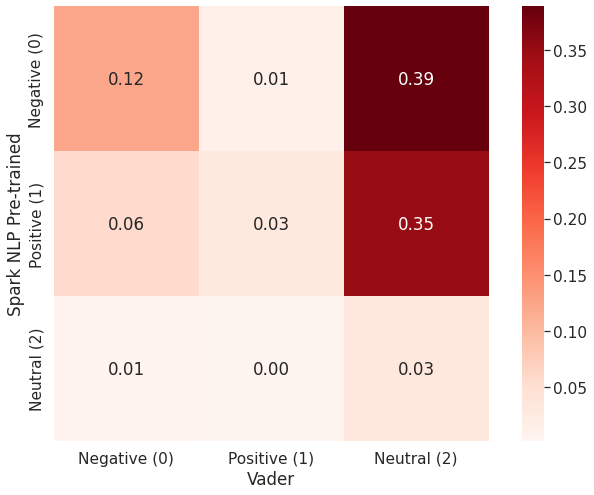

In [0]:
# USe a confusion matrix to compare both labels
y_spnlp = tweets_sparknlp_in.select(['label']).collect()
y_vader = tweets_sparknlp_in.select(['vader_label']).collect()
label_matrix = confusion_matrix(y_spnlp, y_vader, normalize='all') 
plt.figure(figsize = (12,8)) 
sns.set(font_scale=1.4) 
ax = sns.heatmap(label_matrix, cmap='Reds',annot=True, fmt='.2f', square=True,xticklabels=['Negative (0)', 'Positive (1)','Neutral (2)'], yticklabels=['Negative (0)', 'Positive (1)','Neutral (2)']) 
ax.set(xlabel='Vader', ylabel='Spark NLP Pre-trained') 

## 5.0 Feature Transformers for ML Classification

### 5.1 Feature Transformer: Tokenizer

In [0]:
# Create tokenizer - breakdown text into "building blocks" to be usedin NLP algos - separate by words
tokenizer = Tokenizer(inputCol="text", outputCol="tokens") # Define transformer function output col = name, inputCol = field to be processed into token list
tweets_tokenized = tokenizer.transform(tweets_sparknlp_in) #apply transformer function to cleaned df
#display(tweets_tokenized) #render

### 5.2 Feature Transformer: Stopword Removal

In [0]:
# Remove stopwords from the token list  
# = no significance in meaning added to sentence, but words that add grammatical structuring; ex. is, are, its
stopword_remover = StopWordsRemover(inputCol="tokens", outputCol="tokens_noStopWords") # Create the function
tweets_stopword = stopword_remover.transform(tweets_tokenized) # Apply function to df
#display(tweets_stopword) #render

### 5.3 Feature Transformer: Count Vectorization

In [0]:
# Get the term-frequency from the tokens with stopwords removed
countvec = CountVectorizer(vocabSize=2**16, inputCol="tokens_noStopWords", outputCol='countvec') #2^16 is arbritary large number = how many unique words should be considered; Create count vectorizer function
countvec_model = countvec.fit(tweets_stopword) #fit the model to the tweets with stopwords removed
tweets_countvec = countvec_model.transform(tweets_stopword) #apply the transfomer to the tweets with stopwords removed
#display(tweets_countvec) #render

### 5.4 Feature Transformer: TF-IDF Vectorization

In [0]:
# Inverse-Document Frequency - the most a word appears in a collection of tweets, the less important it will be 
# Ex. 'World Cup' in World Cup tweets will not play any significance in sentiment - remove it so it doesn't burden the model
# Ex. if sad only appears in 3 of tweets - then it will more likely affect the sentiment outcome
# So we filter  the lower bound so that words appears less than a value will also be removed from impacting the model
idf = IDF(inputCol='countvec', outputCol="1gram_idf", minDocFreq=5) #minDocFreq: remove sparse terms appearing less than 5 times troughout all the tweets
idf_model = idf.fit(tweets_countvec) #fit to last processed tweets df
tweets_idf = idf_model.transform(tweets_countvec) #transform last processed tweets df
#display(tweets_idf) #render

### 5.5 NGram Features

Why N-Gram? <br>
- Ex. Not Good = two words might cancel eachother out, need context to combine the 2 for a negative sentiment instead of neutral; N-gram can take care of this

In [0]:
# Define the ngram transformer
ngram = NGram(n=2, inputCol="tokens_noStopWords", outputCol="2gram") #
tweets_ngram = ngram.transform(tweets_idf)
# Hasing Token Frequency
ngram_hashingtf = HashingTF(inputCol="2gram", outputCol="2gram_tf", numFeatures=20000)
tweets_hashingtf = ngram_hashingtf.transform(tweets_ngram)
# Get inverse document frequency
ngram_idf = IDF(inputCol='2gram_tf', outputCol="2gram_idf", minDocFreq=5) 
ngram_idf_model = ngram_idf.fit(tweets_hashingtf)
tweets_ngram_idf = ngram_idf_model.transform(tweets_hashingtf)
#display(tweets_hashingtf)

### 5.6 Feature Assembly

In [0]:
# Vector Assembler (1gram + 2gram)
#assembler = VectorAssembler(inputCols=["1gram_idf", "2gram_tf"], outputCol="rawFeatures")  #formatting for multiple feature cols 
assembler = VectorAssembler(inputCols=["1gram_idf", "2gram_idf"], outputCol="rawFeatures")  #formatting for multiple feature cols 
tweets_assembly = assembler.transform(tweets_ngram_idf)
# Chi-square variable selection
selector = ChiSqSelector(numTopFeatures=2**14,featuresCol='rawFeatures', outputCol="features")
# Transform df
selector_model = selector.fit(tweets_assembly)
tweets_features = selector_model.transform(tweets_assembly)

In [0]:
# Write pre-processed
tweets_features.write.parquet('/mnt/my_bucket/twitterInflation_features_2.parquet')

Normally a pipeline would be setup to include the tokenizer, stopword remover, count vertorization, IDF, and label encoder before fitting the model <br>
In this case, this was carried out before the SparkNLP model was used for 'auto-labelling' <br> 
Since this is just an exercise to learn pyspark, the dataframe with encoded features that was pre-processed in Sections 2-5 will be used. **A proper pipeline will be built for the clustering exercise in another notebook, which can take the raw data exported by Kinesis Firehose**

## 6.0 Logistic Regression

### 6.1 Test-Train Split

In [0]:
# Load the data back in
tweets_features = spark.read.parquet('/mnt/my_bucket/twitterInflation_features_2.parquet')

In [0]:
# Repartition and cache - otherwise issues arising with performing randomSplit & sample
tweets_features = tweets_features.repartition(1)
tweets_features.cache()

Out[15]: DataFrame[id: string, name: string, username: string, tweet: string, followers_count: string, location: string, created_at: string, text: string, F_retweet: boolean, F_reply: boolean, F_mentions: boolean, F_hastag: boolean, mentions: array<string>, hastags: array<string>, vader_score: float, vader_label: int, snlp_sentiment: string, label: double, tokens: array<string>, tokens_noStopWords: array<string>, countvec: vector, 1gram_idf: vector, 2gram: array<string>, 2gram_tf: vector, 2gram_idf: vector, rawFeatures: vector, features: vector]

In [0]:
# Test-Train Split
trainSet, testSet = tweets_features.randomSplit([0.7, 0.3],123) #random split is sufficient, there is unlikely issues with biasing this dataset
#Need to repartition or it will cause 'command exited with code 134' - there are also inconsistencies with the splitting algorithm across different partition

In [0]:
# Ensure 1 partition - had issues with training model
trainSet.repartition(1)
trainSet.cache()
testSet.repartition(1)
testSet.cache()

Out[98]: DataFrame[id: string, name: string, username: string, tweet: string, followers_count: string, location: string, created_at: string, text: string, F_retweet: boolean, F_reply: boolean, F_mentions: boolean, F_hastag: boolean, mentions: array<string>, hastags: array<string>, vader_score: float, vader_label: int, snlp_sentiment: string, label: double, tokens: array<string>, tokens_noStopWords: array<string>, countvec: vector, 1gram_idf: vector, 2gram: array<string>, 2gram_tf: vector, 2gram_idf: vector, rawFeatures: vector, features: vector]

Logistic Regression Parameters:
-  regParam (): regularization parameter λ
- elasticNetParam:  corresponds to α. 
- If a linear regression model is trained with the elastic net parameter α set to 1, it is equivalent to a Lasso model.If α is set to 0, the trained model reduces to a ridge regression model
 - More info: https://towardsdatascience.com/the-choice-of-regularization-ridge-lasso-and-elastic-net-regression-fc696f697209

### 6.2 GridSearch Cross-Validation

This section had many issues in running, ultimately it's critical to set: PYSPARK_PIN_THREAD=true ./bin/pyspark' to the cluster environment variables & spark.sparkContext.setLocalProperty("spark.python.pinned", "true"). Otherwise it  does not work and any repartitioning of the train set does not work.

In [0]:
# Intialize the logistic regression model & parameter grid
lr_cv = LogisticRegression(maxIter=50) #, regParam=0.3, elasticNetParam=0.8
# Parameter Grid for Cross Validation
paramGrid = (ParamGridBuilder()
             .addGrid(lr_cv.regParam, [0.1, 0.3, 0.5,0.7,0.9]) # regularization parameter
             .addGrid(lr_cv.elasticNetParam, [0.0,0.15, 0.3,0.5,0.75,0.9]) # Elastic Net Parameter 
             .build())

In [0]:
# Cross-validation
# Set the evaluator to the multi-class evaluator
evaluator = MulticlassClassificationEvaluator(predictionCol="prediction")
# Initialize model - 5-fold cv
cv = CrossValidator(estimator=lr_cv, \
                    estimatorParamMaps=paramGrid, \
                    evaluator=evaluator, \
                    numFolds=5)

In [0]:
spark.sparkContext.setLocalProperty("spark.python.pinned", "true")

In [0]:
# Fit & Predict
lr_cv_model = cv.fit(trainSet) #fit on the training set - label provided by the spark-nlp model

In [0]:
best_lr = lr_cv_model.bestModel
print("Regularization parameter (α) {:.2}:".format(best_lr.getRegParam()))
print("Elastic net (λ) {:.2}:".format(best_lr.getElasticNetParam()))

Regularization parameter (α) 0.1:
Elastic net (λ) 0.0:


In [0]:
# Save the model & predictions
lr_cv_model.save("~/mlmodels/models/Twitter_LR_CV2")

In [0]:
# Load the model
lr_cv_model_in = CrossValidatorModel.load("dbfs:/~/mlmodels/models/Twitter_LR_CV2")

In [0]:
# Predictions on the test & train sets
lr_cv_pred_test = lr_cv_model_in.transform(testSet) 
lr_cv_pred_train = lr_cv_model_in.transform(trainSet) 

In [0]:
# Predict on the entire dataset and export for athena/quicksight
lr_cv_pred_all = lr_cv_model.transform(tweets_features) 
# Write pre-processed
lr_cv_pred_all.write.parquet('/mnt/my_bucket/twitterInflation_lr_pred_all.parquet')

In [0]:
lr_cv_pred_all = spark.read.parquet('/mnt/my_bucket/twitterInflation_lr_pred_all.parquet')

In [0]:
display(lr_cv_pred_all)

id,name,username,tweet,followers_count,location,created_at,text,F_retweet,F_reply,F_mentions,F_hastag,mentions,hastags,vader_score,vader_label,snlp_sentiment,label,tokens,tokens_noStopWords,countvec,1gram_idf,2gram,2gram_tf,2gram_idf,rawFeatures,features,rawPrediction,probability,prediction
1603461118625779723,Mike “Yeet everything”💬🏴‍☠️🔭🎙,IrritatedMike,It’s the look of someone who’s out of touch with the room.,1562,My corner of Earth,Thu Dec 15 18:44:56 +0000 2022,It’s the look of someone who’s out of touch with the room.,false,false,false,false,List(),List(),0.0,2,negative,0.0,"List(it’s, the, look, of, someone, who’s, out, of, touch, with, the, room.)","List(it’s, look, someone, who’s, touch, room.)","Map(vectorType -> sparse, length -> 65536, indices -> List(27, 116, 453, 2382, 2744, 10248), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 65536, indices -> List(27, 116, 453, 2382, 2744, 10248), values -> List(4.013271939611547, 4.794121945773456, 5.775071499537207, 7.506149733027449, 7.671229483386897, 9.38888098046123))","List(it’s look, look someone, someone who’s, who’s touch, touch room.)","Map(vectorType -> sparse, length -> 20000, indices -> List(1767, 4995, 14896, 15778, 19775), values -> List(1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 20000, indices -> List(1767, 4995, 14896, 15778, 19775), values -> List(7.717139184690975, 7.223917265343233, 7.322922789118682, 7.984887042241939, 7.993697671924094))","Map(vectorType -> sparse, length -> 85536, indices -> List(27, 116, 453, 2382, 2744, 10248, 67303, 70531, 80432, 81314, 85311), values -> List(4.013271939611547, 4.794121945773456, 5.775071499537207, 7.506149733027449, 7.671229483386897, 9.38888098046123, 7.717139184690975, 7.223917265343233, 7.322922789118682, 7.984887042241939, 7.993697671924094))","Map(vectorType -> sparse, length -> 16384, indices -> List(27, 106, 15007, 16320), values -> List(4.013271939611547, 4.794121945773456, 7.322922789118682, 7.993697671924094))","Map(vectorType -> dense, length -> 3, values -> List(0.4160241562668575, 0.9355663557896952, -1.3515905120565526))","Map(vectorType -> dense, length -> 3, values -> List(0.3506314351219639, 0.5895018327247337, 0.059866732153302495))",1.0
1603461119074787328,🕷️,1OF1PISCES,"with inflation irdgaf about some maybe opportunities, show me the money!",410,None,Thu Dec 15 18:44:56 +0000 2022,"with inflation irdgaf about some maybe opportunities, show me the money!",false,false,false,false,List(),List(),0.4389,2,positive,1.0,"List(with, inflation, irdgaf, about, some, maybe, opportunities,, show, me, the, money!)","List(inflation, irdgaf, maybe, opportunities,, show, money!)","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 213, 371, 3831, 34805), values -> List(1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 65536, indices -> List(0, 213, 371, 3831, 34805), values -> List(0.7682934908407092, 5.226655275604869, 5.604691346542969, 8.096112677352163, 10.929326021408379))","List(inflation irdgaf, irdgaf maybe, maybe opportunities,, opportunities, show, show money!)","Map(vectorType -> sparse, length -> 20000, indices -> List(5844, 8311, 9456, 13354, 13617), values -> List(1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 20000, indices -> List(5844, 8311, 9456, 13354, 13617), values -> List(8.210225984119583, 8.243748676158228, 8.0863565024068, 7.5562995167129205, 8.266738194382926))","Map(vectorType -> sparse, length -> 85536, indices -> List(0, 213, 371, 3831, 34805, 71380, 73847, 74992, 78890, 79153), values -> List(0.7682934908407092, 5.226655275604869, 5.604691346542969, 8.096112677352163, 10.929326021408379, 8.210225984119583, 8.243748676158228, 8.0863565024068, 7.5562995167129205, 8.266738194382926))","Map(vectorType -> sparse, length -> 16384, indices -> List(0, 189, 13529, 14612), values -> List(0.7682934908407092, 5.226655275604869, 8.0863565024068, 7.5562995167129205))","Map(vectorType -> dense, len

In [0]:
# Drop columns with arrays for csv for use in Athena
lr_cv_pred_all.drop("mentions","hastags","tokens","tokens_noStopWords","countvec","1gram_idf","2gram","2gram_tf","2gram_idf","rawFeatures","features","rawPrediction","probability") \
.write.mode("overwrite").option('header','false').option("delimiter","|").csv('/mnt/my_bucket/twitterInflation_lr_pred_all_delimited.csv')

In [0]:
# Use pyspark-ml multi-class evaluator for test accuracy
evaluator = MulticlassClassificationEvaluator(predictionCol="prediction")
roc_auc = evaluator.evaluate(lr_cv_pred_test)
print("Accuracy: " + str(100*round(evaluator.evaluate(lr_cv_pred_test, {evaluator.metricName: "accuracy"}),2))+'%') #method 1 of formatting
print("ROC_AUC: {:.2%}".format(roc_auc)) #method 2 of formatting

Accuracy: 74.0%
ROC_AUC: 73.35%


In [0]:
# sklearn for confusion matrices
# Test eval
y_true_test_lr_cv = lr_cv_pred_test.select(['label']).collect()
y_pred_test_lr_cv = lr_cv_pred_test.select(['prediction']).collect()
print("Test Confusion Matrix")
print(classification_report(y_true_test_lr_cv, y_pred_test_lr_cv))
y_true_train_lr_cv = lr_cv_pred_train.select(['label']).collect()
y_pred_train_lr_cv = lr_cv_pred_train.select(['prediction']).collect()
# # Train eval
print("Train Confusion Matrix")
print(classification_report(y_true_train_lr_cv, y_pred_train_lr_cv))

Test Confusion Matrix
              precision    recall  f1-score   support

         0.0       0.76      0.81      0.78     52601
         1.0       0.73      0.73      0.73     44010
         2.0       0.65      0.07      0.12      3869

    accuracy                           0.74    100480
   macro avg       0.71      0.53      0.54    100480
weighted avg       0.74      0.74      0.73    100480

Train Confusion Matrix
              precision    recall  f1-score   support

         0.0       0.78      0.83      0.81    122508
         1.0       0.76      0.76      0.76    102730
         2.0       0.93      0.10      0.18      9013

    accuracy                           0.77    234251
   macro avg       0.82      0.56      0.58    234251
weighted avg       0.78      0.77      0.76    234251



Out[20]: [Text(0.5, 43.5, 'Predicted'), Text(180.30000000000013, 0.5, 'Actual')]

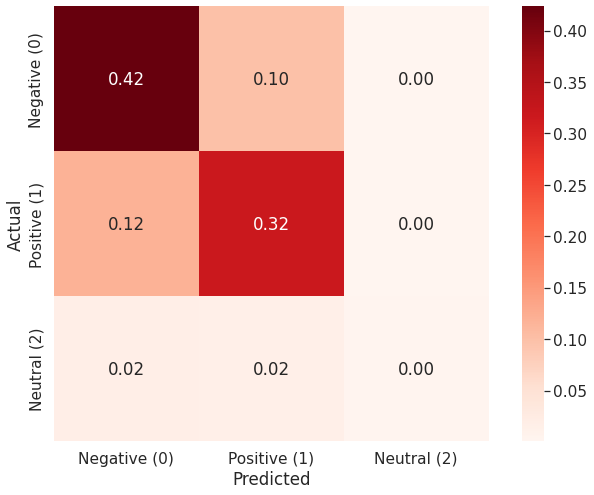

In [0]:
# Confusion Matrix
conf_matrix_lr_cv = confusion_matrix(y_true_test_lr_cv, y_pred_test_lr_cv, normalize='all') 
plt.figure(figsize = (12,8)) 
sns.set(font_scale=1.4) 
ax = sns.heatmap(conf_matrix_lr_cv, cmap='Reds',annot=True, fmt='.2f', square=True,xticklabels=['Negative (0)', 'Positive (1)','Neutral (2)'], yticklabels=['Negative (0)', 'Positive (1)','Neutral (2)']) 
ax.set(xlabel='Predicted', ylabel='Actual') 

## 7.0 Random Forest Classifier - GridCV Cross-Validation

In [0]:
# Intialize the logistic regression model & parameter grid
rf = RandomForestClassifier(subsamplingRate=0.7) #Fraction of the training data used for learning each decision tree
# Parameter Grid for Cross Validation
paramGrid = (ParamGridBuilder()
             .addGrid(rf.maxDepth, [3,5,7]) # tree depth usually 3-7 range
             .addGrid(rf.numTrees, [10,20,50,100]) # number of trees in forest
             .build())

In [0]:
# Cross-validation
# Set the evaluator to the multi-class evaluator
evaluator = MulticlassClassificationEvaluator(predictionCol="prediction")
# Initialize model - 5-fold cv
rf_cv = CrossValidator(estimator=rf, \
                    estimatorParamMaps=paramGrid, \
                    evaluator=evaluator, \
                    numFolds=5)

In [0]:
spark.sparkContext.setLocalProperty("spark.python.pinned", "true")

In [0]:
# Fit & Predict
rf_cv_model = rf_cv.fit(trainSet) #fit on the training set - label provided by the spark-nlp model

In [0]:
# Save the model
rf_cv_model.save("~/mlmodels/models/Twitter_RF_CV")

In [0]:
%fs ls dbfs:/~/mlmodels/models/Twitter_RF_CV

path,name,size,modificationTime
dbfs:/~/mlmodels/models/Twitter_RF_CV/bestModel/,bestModel/,0,1673330177940
dbfs:/~/mlmodels/models/Twitter_RF_CV/estimator/,estimator/,0,1673330177940
dbfs:/~/mlmodels/models/Twitter_RF_CV/evaluator/,evaluator/,0,1673330177940
dbfs:/~/mlmodels/models/Twitter_RF_CV/metadata/,metadata/,0,1673330177940


In [0]:
# Load the model
rf_cv_model_in = CrossValidatorModel.load("dbfs:/~/mlmodels/models/Twitter_RF_CV")

In [0]:
# Predictions on the test & train sets
rf_cv_pred_test = rf_cv_model_in.transform(testSet) 
rf_cv_pred_train = rf_cv_model_in.transform(trainSet) 

In [0]:
# Prediction on full dataset
rf_cv_pred_all = rf_cv_model_in.transform(tweets_features)

In [0]:
# Drop columns with arrays for csv for use in Athena
rf_cv_pred_all.drop("mentions","hastags","tokens","tokens_noStopWords","countvec","1gram_idf","2gram","2gram_tf","2gram_idf","rawFeatures","features","rawPrediction","probability") \
.write.mode("overwrite").option('header','false').option("delimiter","|").csv('/mnt/my_bucket/twitterInflation_rf_pred_all_delimited.csv')

In [0]:
best_rf = rf_cv_model_in.bestModel
print("Number of Trees {:}".format(float(best_rf.getNumTrees)))
print("Max Depth {:}".format(float(best_rf.getMaxDepth())))

Number of Trees 10.0
Max Depth 7.0


In [0]:
# Use pyspark-ml multi-class evaluator for test accuracy
evaluator = MulticlassClassificationEvaluator(predictionCol="prediction")
roc_auc = evaluator.evaluate(rf_cv_pred_test)
print("Accuracy: " + str(100*round(evaluator.evaluate(rf_cv_pred_test, {evaluator.metricName: "accuracy"}),2))+'%') #method 1 of formatting
print("ROC_AUC: {:.2%}".format(roc_auc)) #method 2 of formatting

Accuracy: 54.0%
ROC_AUC: 40.20%


In [0]:
# sklearn for confusion matrices
# Test eval
y_true_test_rf_cv = rf_cv_pred_test.select(['label']).collect()
y_pred_test_rf_cv = rf_cv_pred_test.select(['prediction']).collect()
print("Test Confusion Matrix")
print(classification_report(y_true_test_rf_cv, y_pred_test_rf_cv))
y_true_train_rf_cv = rf_cv_pred_train.select(['label']).collect()
y_pred_train_rf_cv = rf_cv_pred_train.select(['prediction']).collect()
# # Train eval
print("Train Confusion Matrix")
print(classification_report(y_true_train_rf_cv, y_pred_train_rf_cv))

Test Confusion Matrix
/databricks/python/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/databricks/python/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/databricks/python/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
              precisi

Out[24]: [Text(0.5, 43.5, 'Predicted'), Text(180.30000000000013, 0.5, 'Actual')]

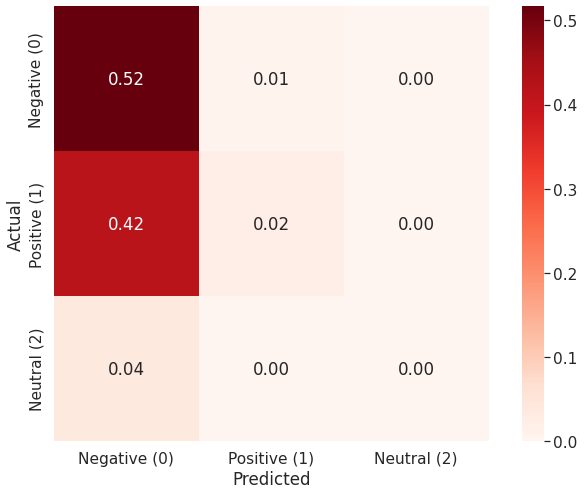

In [0]:
# Confusion Matrix
conf_matrix_rf_cv = confusion_matrix(y_true_test_rf_cv, y_pred_test_rf_cv, normalize='all') 
plt.figure(figsize = (12,8)) 
sns.set(font_scale=1.4) 
ax = sns.heatmap(conf_matrix_rf_cv, cmap='Reds',annot=True, fmt='.2fd', square=True,xticklabels=['Negative (0)', 'Positive (1)','Neutral (2)'], yticklabels=['Negative (0)', 'Positive (1)','Neutral (2)']) 
ax.set(xlabel='Predicted', ylabel='Actual') 